In [1]:
import pandas as pd
import numpy as np

In [2]:
file1 = pd.read_csv('marketing_customer_analysis.csv')
display(file1)

,Unnamed: 0,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,...,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size,Vehicle Type
0,0,DK49336,Arizona,4809.216960,No,Basic,College,2/18/11,Employed,M,...,0.0,9,Corporate Auto,Corporate L3,Offer3,Agent,292.800000,Four-Door Car,Medsize,NaN
1,1,KX64629,California,2228.525238,No,Basic,College,1/18/11,Unemployed,F,...,0.0,1,Personal Auto,Personal L3,Offer4,Call Center,744.924331,Four-Door Car,Medsize,NaN
2,2,LZ68649,Washington,14947.917300,No,Basic,Bachelor,2/10/11,Employed,M,...,0.0,2,Personal Auto,Personal L3,Offer3,Call Center,480.000000,SUV,Medsize,A
3,3,XL78013,Oregon,22332.439460,Yes,Extended,College,1/11/11,Employed,M,...,0.0,2,Corporate Auto,Corporate L3,Offer2,Branch,484.013411,Four-Door Car,Medsize,A
4,4,QA50777,Oregon,9025.067525,No,Premium,Bachelor,1/17/11,Medical Leave,F,...,NaN,7,Personal Auto,Personal L2,Offer1,Branch,707.925645,Four-Door Car,Medsize,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10905,10905,FE99816,Nevada,15563.369440,No,Premium,Bachelor,1/19/11,Unemployed,F,...,NaN,7,Personal Auto,Personal L1,Offer3,Web,1214.400000,Luxury Car,Medsize,A
10906,10906,KX53892,Oregon,5259.444853,No,Basic,College,1/6/11,Employed,F,...,0.0,6,Personal Auto,Personal L3,Offer2,Branch,273.018929,Four-Door Car,Medsize,A
10907,10907,TL39050,Arizona,23893.304100,No,Extended,Bachelor,2/6/11,Employed,F,...,0.0,2,Corporate Auto,Corporate L3,Offer1,Web,381.306996,Luxury SUV,Medsize,NaN
10908,10908,WA60547,California,11971.977650,No,Premium,College,2/13/11,Employed,F,...,4.0,6,Personal Auto,Personal L1,Offer1,Branch,618.288849,SUV,Medsize,A


In [3]:
file1.shape

(10910, 26)

In [4]:
new_names = {
    'Customer': 'customer_id',
    'Unnamed: 0': 'unnamed: 0',
    'State': 'state',
    'Customer Lifetime Value': 'customer_lifetime_value',
    'Response': 'response',
    'Coverage': 'coverage',
    'Education': 'education',
    'Effective To Date': 'effective_to_date',
    'EmploymentStatus': 'employment_status',
    'Gender': 'gender',
    'Number of Open Complaints': 'num_open_complaints',
    'Number of Policies': 'num_policies',
    'Policy Type': 'policy_type',
    'Policy': 'policy',
    'Renew Offer Type': 'renew_offer_type',
    'Sales Channel': 'sales_channel',
    'Total Claim Amount': 'total_claim_amount',
    'Vehicle Class': 'vehicle_class',
    'Vehicle Size': 'vehicle_size',
    'Vehicle Type': 'vehicle_type'
}

file1 = file1.rename(columns=new_names)
display(file1.columns)

Index(['unnamed: 0', 'customer_id', 'state', 'customer_lifetime_value',
       'response', 'coverage', 'education', 'effective_to_date',
       'employment_status', 'gender', 'Income', 'Location Code',
       'Marital Status', 'Monthly Premium Auto', 'Months Since Last Claim',
       'Months Since Policy Inception', 'num_open_complaints', 'num_policies',
       'policy_type', 'policy', 'renew_offer_type', 'sales_channel',
       'total_claim_amount', 'vehicle_class', 'vehicle_size', 'vehicle_type'],
      dtype='object')

In [5]:
num_cols = file1.select_dtypes(include=['int64', 'float64']).columns
display(num_cols)

Index(['unnamed: 0', 'customer_lifetime_value', 'Income',
       'Monthly Premium Auto', 'Months Since Last Claim',
       'Months Since Policy Inception', 'num_open_complaints', 'num_policies',
       'total_claim_amount'],
      dtype='object')

In [6]:
obj_cols = file1.select_dtypes(include=['object']).columns
display(obj_cols)

Index(['customer_id', 'state', 'response', 'coverage', 'education',
       'effective_to_date', 'employment_status', 'gender', 'Location Code',
       'Marital Status', 'policy_type', 'policy', 'renew_offer_type',
       'sales_channel', 'vehicle_class', 'vehicle_size', 'vehicle_type'],
      dtype='object')

In [7]:
display(file1.isna())
file1.dropna(inplace=True)
display(file1)

,unnamed: 0,customer_id,state,customer_lifetime_value,response,coverage,education,effective_to_date,employment_status,gender,...,num_open_complaints,num_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,vehicle_type
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10905,False,False,False,False,False,False,False,False,False,False,...,True,False,False,False,False,False,False,False,False,False
10906,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
10907,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
10908,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


,unnamed: 0,customer_id,state,customer_lifetime_value,response,coverage,education,effective_to_date,employment_status,gender,...,num_open_complaints,num_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,vehicle_type
2,2,LZ68649,Washington,14947.917300,No,Basic,Bachelor,2/10/11,Employed,M,...,0.0,2,Personal Auto,Personal L3,Offer3,Call Center,480.000000,SUV,Medsize,A
3,3,XL78013,Oregon,22332.439460,Yes,Extended,College,1/11/11,Employed,M,...,0.0,2,Corporate Auto,Corporate L3,Offer2,Branch,484.013411,Four-Door Car,Medsize,A
10,10,HG93801,Arizona,5154.764074,No,Extended,High School or Below,1/2/11,Employed,M,...,0.0,1,Corporate Auto,Corporate L3,Offer2,Branch,442.521087,SUV,Large,A
13,13,KR82385,California,5454.587929,No,Basic,Master,1/26/11,Employed,M,...,0.0,4,Personal Auto,Personal L3,Offer4,Call Center,331.200000,Two-Door Car,Medsize,A
16,16,FH51383,California,5326.677654,No,Basic,High School or Below,2/7/11,Employed,F,...,0.0,6,Personal Auto,Personal L3,Offer4,Call Center,300.528579,Two-Door Car,Large,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10902,10902,PP30874,California,3579.023825,No,Extended,High School or Below,1/24/11,Employed,F,...,2.0,1,Personal Auto,Personal L2,Offer2,Agent,655.200000,Four-Door Car,Medsize,A
10903,10903,SU71163,Arizona,2771.663013,No,Basic,College,1/7/11,Employed,M,...,4.0,1,Personal Auto,Personal L2,Offer2,Branch,355.200000,Two-Door Car,Medsize,A
10904,10904,QI63521,Nevada,19228.463620,No,Basic,High School or Below,2/24/11,Unemployed,M,...,0.0,2,Personal Auto,Personal L2,Offer1,Branch,897.600000,Luxury SUV,Medsize,A
10906,10906,KX53892,Oregon,5259.444853,No,Basic,College,1/6/11,Employed,F,...,0.0,6,Personal Auto,Personal L3,Offer2,Branch,273.018929,Four-Door Car,Medsize,A


In [8]:
file1['effective_to_date'] = pd.to_datetime(file1['effective_to_date'])
file1['month'] = file1['effective_to_date'].dt.month
q1_data = file1[(file1['month'] >= 1) & (file1['month'] <= 3)]
display(q1_data)
display(file1)

,unnamed: 0,customer_id,state,customer_lifetime_value,response,coverage,education,effective_to_date,employment_status,gender,...,num_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,vehicle_type,month
2,2,LZ68649,Washington,14947.917300,No,Basic,Bachelor,2011-02-10,Employed,M,...,2,Personal Auto,Personal L3,Offer3,Call Center,480.000000,SUV,Medsize,A,2
3,3,XL78013,Oregon,22332.439460,Yes,Extended,College,2011-01-11,Employed,M,...,2,Corporate Auto,Corporate L3,Offer2,Branch,484.013411,Four-Door Car,Medsize,A,1
10,10,HG93801,Arizona,5154.764074,No,Extended,High School or Below,2011-01-02,Employed,M,...,1,Corporate Auto,Corporate L3,Offer2,Branch,442.521087,SUV,Large,A,1
13,13,KR82385,California,5454.587929,No,Basic,Master,2011-01-26,Employed,M,...,4,Personal Auto,Personal L3,Offer4,Call Center,331.200000,Two-Door Car,Medsize,A,1
16,16,FH51383,California,5326.677654,No,Basic,High School or Below,2011-02-07,Employed,F,...,6,Personal Auto,Personal L3,Offer4,Call Center,300.528579,Two-Door Car,Large,A,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10902,10902,PP30874,California,3579.023825,No,Extended,High School or Below,2011-01-24,Employed,F,...,1,Personal Auto,Personal L2,Offer2,Agent,655.200000,Four-Door Car,Medsize,A,1
10903,10903,SU71163,Arizona,2771.663013,No,Basic,College,2011-01-07,Employed,M,...,1,Personal Auto,Personal L2,Offer2,Branch,355.200000,Two-Door Car,Medsize,A,1
10904,10904,QI63521,Nevada,19228.463620,No,Basic,High School or Below,2011-02-24,Unemployed,M,...,2,Personal Auto,Personal L2,Offer1,Branch,897.600000,Luxury SUV,Medsize,A,2
10906,10906,KX53892,Oregon,5259.444853,No,Basic,College,2011-01-06,Employed,F,...,6,Personal Auto,Personal L3,Offer2,Branch,273.018929,Four-Door Car,Medsize,A,1


,unnamed: 0,customer_id,state,customer_lifetime_value,response,coverage,education,effective_to_date,employment_status,gender,...,num_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,vehicle_type,month
2,2,LZ68649,Washington,14947.917300,No,Basic,Bachelor,2011-02-10,Employed,M,...,2,Personal Auto,Personal L3,Offer3,Call Center,480.000000,SUV,Medsize,A,2
3,3,XL78013,Oregon,22332.439460,Yes,Extended,College,2011-01-11,Employed,M,...,2,Corporate Auto,Corporate L3,Offer2,Branch,484.013411,Four-Door Car,Medsize,A,1
10,10,HG93801,Arizona,5154.764074,No,Extended,High School or Below,2011-01-02,Employed,M,...,1,Corporate Auto,Corporate L3,Offer2,Branch,442.521087,SUV,Large,A,1
13,13,KR82385,California,5454.587929,No,Basic,Master,2011-01-26,Employed,M,...,4,Personal Auto,Personal L3,Offer4,Call Center,331.200000,Two-Door Car,Medsize,A,1
16,16,FH51383,California,5326.677654,No,Basic,High School or Below,2011-02-07,Employed,F,...,6,Personal Auto,Personal L3,Offer4,Call Center,300.528579,Two-Door Car,Large,A,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10902,10902,PP30874,California,3579.023825,No,Extended,High School or Below,2011-01-24,Employed,F,...,1,Personal Auto,Personal L2,Offer2,Agent,655.200000,Four-Door Car,Medsize,A,1
10903,10903,SU71163,Arizona,2771.663013,No,Basic,College,2011-01-07,Employed,M,...,1,Personal Auto,Personal L2,Offer2,Branch,355.200000,Two-Door Car,Medsize,A,1
10904,10904,QI63521,Nevada,19228.463620,No,Basic,High School or Below,2011-02-24,Unemployed,M,...,2,Personal Auto,Personal L2,Offer1,Branch,897.600000,Luxury SUV,Medsize,A,2
10906,10906,KX53892,Oregon,5259.444853,No,Basic,College,2011-01-06,Employed,F,...,6,Personal Auto,Personal L3,Offer2,Branch,273.018929,Four-Door Car,Medsize,A,1


In [9]:
def transform_data(file_path):
    file1['month'] = pd.to_datetime(file1['Effective To Date']).dt.month
    first_quarter = file1[file1['month'].isin([1, 2, 3])]
    return first_quarter
display(file1)

,unnamed: 0,customer_id,state,customer_lifetime_value,response,coverage,education,effective_to_date,employment_status,gender,...,num_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,vehicle_type,month
2,2,LZ68649,Washington,14947.917300,No,Basic,Bachelor,2011-02-10,Employed,M,...,2,Personal Auto,Personal L3,Offer3,Call Center,480.000000,SUV,Medsize,A,2
3,3,XL78013,Oregon,22332.439460,Yes,Extended,College,2011-01-11,Employed,M,...,2,Corporate Auto,Corporate L3,Offer2,Branch,484.013411,Four-Door Car,Medsize,A,1
10,10,HG93801,Arizona,5154.764074,No,Extended,High School or Below,2011-01-02,Employed,M,...,1,Corporate Auto,Corporate L3,Offer2,Branch,442.521087,SUV,Large,A,1
13,13,KR82385,California,5454.587929,No,Basic,Master,2011-01-26,Employed,M,...,4,Personal Auto,Personal L3,Offer4,Call Center,331.200000,Two-Door Car,Medsize,A,1
16,16,FH51383,California,5326.677654,No,Basic,High School or Below,2011-02-07,Employed,F,...,6,Personal Auto,Personal L3,Offer4,Call Center,300.528579,Two-Door Car,Large,A,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10902,10902,PP30874,California,3579.023825,No,Extended,High School or Below,2011-01-24,Employed,F,...,1,Personal Auto,Personal L2,Offer2,Agent,655.200000,Four-Door Car,Medsize,A,1
10903,10903,SU71163,Arizona,2771.663013,No,Basic,College,2011-01-07,Employed,M,...,1,Personal Auto,Personal L2,Offer2,Branch,355.200000,Two-Door Car,Medsize,A,1
10904,10904,QI63521,Nevada,19228.463620,No,Basic,High School or Below,2011-02-24,Unemployed,M,...,2,Personal Auto,Personal L2,Offer1,Branch,897.600000,Luxury SUV,Medsize,A,2
10906,10906,KX53892,Oregon,5259.444853,No,Basic,College,2011-01-06,Employed,F,...,6,Personal Auto,Personal L3,Offer2,Branch,273.018929,Four-Door Car,Medsize,A,1


In [10]:
#ROUND 3 STARTS HERE

In [11]:
file1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4543 entries, 2 to 10908
Data columns (total 27 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   unnamed: 0                     4543 non-null   int64         
 1   customer_id                    4543 non-null   object        
 2   state                          4543 non-null   object        
 3   customer_lifetime_value        4543 non-null   float64       
 4   response                       4543 non-null   object        
 5   coverage                       4543 non-null   object        
 6   education                      4543 non-null   object        
 7   effective_to_date              4543 non-null   datetime64[ns]
 8   employment_status              4543 non-null   object        
 9   gender                         4543 non-null   object        
 10  Income                         4543 non-null   int64         
 11  Location Code   

In [12]:
file1.describe()

,unnamed: 0,customer_lifetime_value,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,num_open_complaints,num_policies,total_claim_amount,month
count,4543.000000,4543.000000,4543.000000,4543.000000,4543.000000,4543.000000,4543.000000,4543.000000,4543.000000,4543.000000
mean,5540.241250,8033.714059,37453.033238,93.773278,15.111820,48.153863,0.386309,2.980189,436.477525,1.469734
std,3149.146534,6959.529443,30257.399536,35.093661,10.157925,28.146904,0.907553,2.390362,295.026990,0.499138
min,2.000000,1904.000852,0.000000,61.000000,0.000000,0.000000,0.000000,1.000000,0.099007,1.000000
25%,2884.000000,4039.089902,0.000000,69.000000,6.000000,24.000000,0.000000,1.000000,265.686145,1.000000
50%,5549.000000,5846.520588,34455.000000,83.000000,14.000000,47.000000,0.000000,2.000000,384.000000,1.000000
75%,8283.000000,8936.596938,61560.000000,110.000000,23.000000,72.000000,0.000000,4.000000,552.000000,2.000000
max,10908.000000,83325.381190,99961.000000,298.000000,35.000000,99.000000,5.000000,9.000000,2893.239678,2.000000


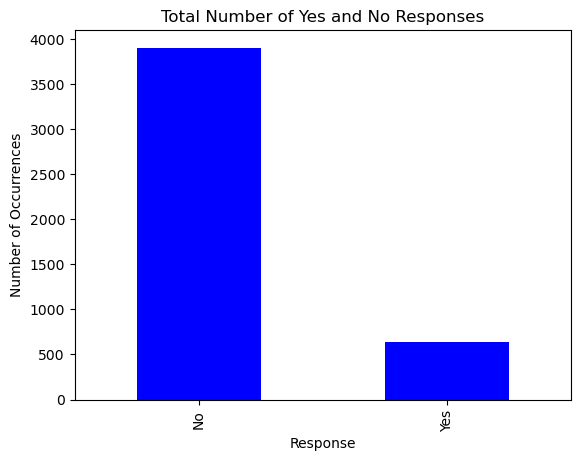

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
counts = file1['response'].value_counts()
counts.plot(kind='bar', color='blue')
plt.xlabel('Response')
plt.ylabel('Number of Occurrences')
plt.title('Total Number of Yes and No Responses')
plt.show()


In [14]:
display(file1)

,unnamed: 0,customer_id,state,customer_lifetime_value,response,coverage,education,effective_to_date,employment_status,gender,...,num_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,vehicle_type,month
2,2,LZ68649,Washington,14947.917300,No,Basic,Bachelor,2011-02-10,Employed,M,...,2,Personal Auto,Personal L3,Offer3,Call Center,480.000000,SUV,Medsize,A,2
3,3,XL78013,Oregon,22332.439460,Yes,Extended,College,2011-01-11,Employed,M,...,2,Corporate Auto,Corporate L3,Offer2,Branch,484.013411,Four-Door Car,Medsize,A,1
10,10,HG93801,Arizona,5154.764074,No,Extended,High School or Below,2011-01-02,Employed,M,...,1,Corporate Auto,Corporate L3,Offer2,Branch,442.521087,SUV,Large,A,1
13,13,KR82385,California,5454.587929,No,Basic,Master,2011-01-26,Employed,M,...,4,Personal Auto,Personal L3,Offer4,Call Center,331.200000,Two-Door Car,Medsize,A,1
16,16,FH51383,California,5326.677654,No,Basic,High School or Below,2011-02-07,Employed,F,...,6,Personal Auto,Personal L3,Offer4,Call Center,300.528579,Two-Door Car,Large,A,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10902,10902,PP30874,California,3579.023825,No,Extended,High School or Below,2011-01-24,Employed,F,...,1,Personal Auto,Personal L2,Offer2,Agent,655.200000,Four-Door Car,Medsize,A,1
10903,10903,SU71163,Arizona,2771.663013,No,Basic,College,2011-01-07,Employed,M,...,1,Personal Auto,Personal L2,Offer2,Branch,355.200000,Two-Door Car,Medsize,A,1
10904,10904,QI63521,Nevada,19228.463620,No,Basic,High School or Below,2011-02-24,Unemployed,M,...,2,Personal Auto,Personal L2,Offer1,Branch,897.600000,Luxury SUV,Medsize,A,2
10906,10906,KX53892,Oregon,5259.444853,No,Basic,College,2011-01-06,Employed,F,...,6,Personal Auto,Personal L3,Offer2,Branch,273.018929,Four-Door Car,Medsize,A,1


In [15]:
file1['sales_channel'].value_counts()

Agent          1751
Branch         1246
Call Center     883
Web             663
Name: sales_channel, dtype: int64

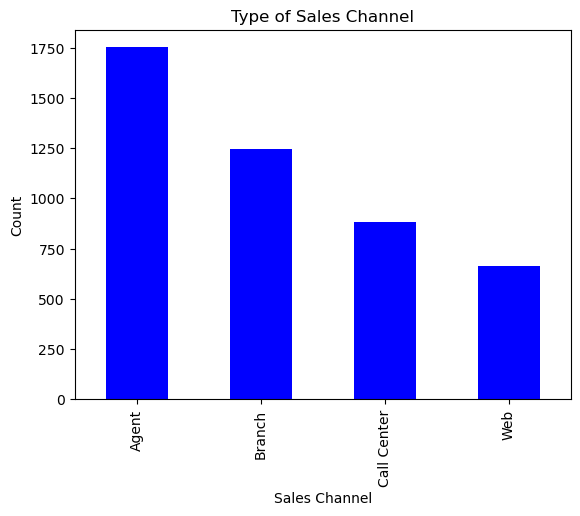

In [16]:
channel_counts = file1['sales_channel'].value_counts()
channel_counts.plot(kind='bar', color='blue')
plt.xlabel('Sales Channel')
plt.ylabel('Count')
plt.title('Type of Sales Channel')
plt.show()

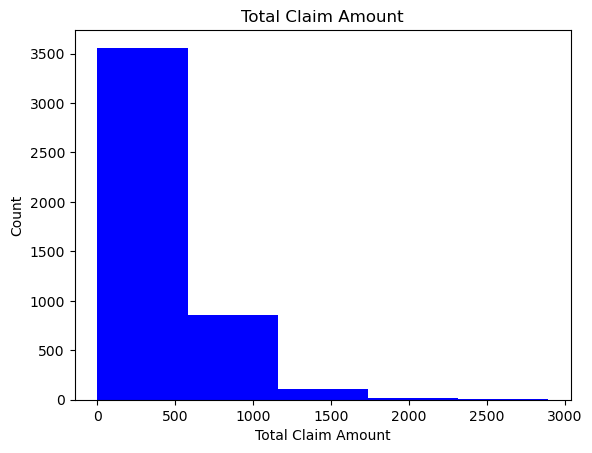

In [17]:
file1['total_claim_amount'].plot(kind='hist', color='blue', bins=5)
plt.xlabel('Total Claim Amount')
plt.ylabel('Count')
plt.title('Total Claim Amount')
plt.show()

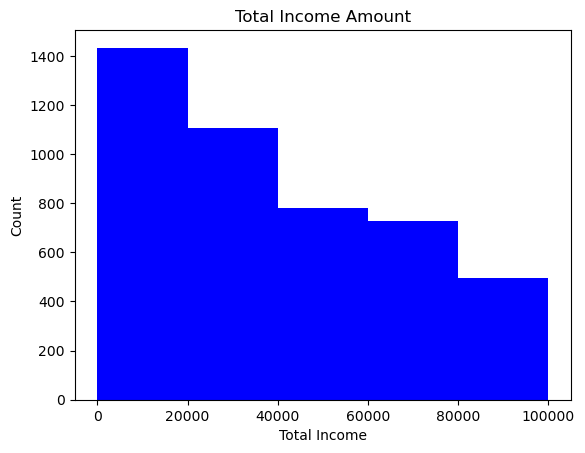

In [18]:
pd.set_option('display.max_columns', None)
file1['Income'].plot(kind='hist', color='blue', bins=5)
plt.xlabel('Total Income')
plt.ylabel('Count')
plt.title('Total Income Amount')
plt.show()

In [19]:
#Round4 Starts

In [20]:
numerical = file1.select_dtypes(include=['int', 'float'])
categorical = file1.select_dtypes(include=['object'])
display(numerical)
display(categorical)

,unnamed: 0,customer_lifetime_value,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,num_open_complaints,num_policies,total_claim_amount,month
2,2,14947.917300,22139,100,34.0,31,0.0,2,480.000000,2
3,3,22332.439460,49078,97,10.0,3,0.0,2,484.013411,1
10,10,5154.764074,82730,127,13.0,31,0.0,1,442.521087,1
13,13,5454.587929,66334,69,25.0,25,0.0,4,331.200000,1
16,16,5326.677654,76717,66,26.0,10,0.0,6,300.528579,2
...,...,...,...,...,...,...,...,...,...,...
10902,10902,3579.023825,28304,91,10.0,30,2.0,1,655.200000,1
10903,10903,2771.663013,59855,74,30.0,82,4.0,1,355.200000,1
10904,10904,19228.463620,0,187,14.0,32,0.0,2,897.600000,2
10906,10906,5259.444853,61146,65,7.0,68,0.0,6,273.018929,1


,customer_id,state,response,coverage,education,employment_status,gender,Location Code,Marital Status,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size,vehicle_type
2,LZ68649,Washington,No,Basic,Bachelor,Employed,M,Suburban,Single,Personal Auto,Personal L3,Offer3,Call Center,SUV,Medsize,A
3,XL78013,Oregon,Yes,Extended,College,Employed,M,Suburban,Single,Corporate Auto,Corporate L3,Offer2,Branch,Four-Door Car,Medsize,A
10,HG93801,Arizona,No,Extended,High School or Below,Employed,M,Urban,Married,Corporate Auto,Corporate L3,Offer2,Branch,SUV,Large,A
13,KR82385,California,No,Basic,Master,Employed,M,Suburban,Single,Personal Auto,Personal L3,Offer4,Call Center,Two-Door Car,Medsize,A
16,FH51383,California,No,Basic,High School or Below,Employed,F,Urban,Married,Personal Auto,Personal L3,Offer4,Call Center,Two-Door Car,Large,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10902,PP30874,California,No,Extended,High School or Below,Employed,F,Suburban,Married,Personal Auto,Personal L2,Offer2,Agent,Four-Door Car,Medsize,A
10903,SU71163,Arizona,No,Basic,College,Employed,M,Suburban,Married,Personal Auto,Personal L2,Offer2,Branch,Two-Door Car,Medsize,A
10904,QI63521,Nevada,No,Basic,High School or Below,Unemployed,M,Suburban,Single,Personal Auto,Personal L2,Offer1,Branch,Luxury SUV,Medsize,A
10906,KX53892,Oregon,No,Basic,College,Employed,F,Urban,Married,Personal Auto,Personal L3,Offer2,Branch,Four-Door Car,Medsize,A


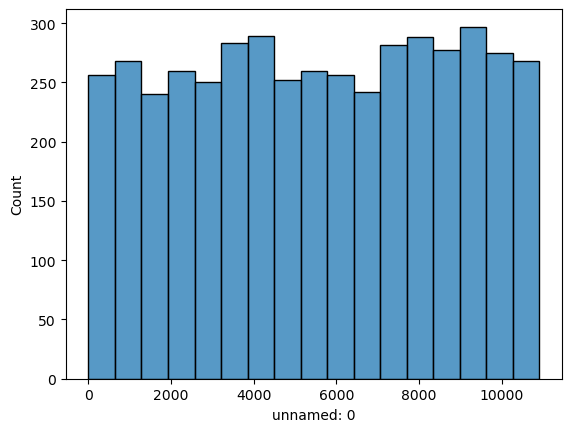

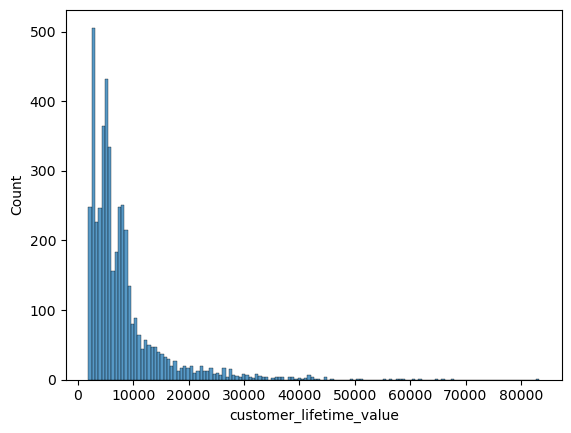

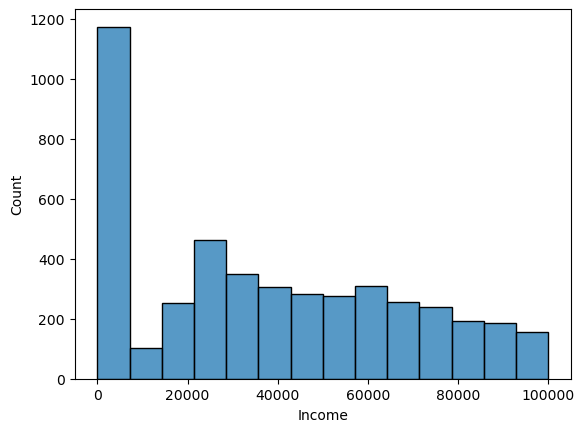

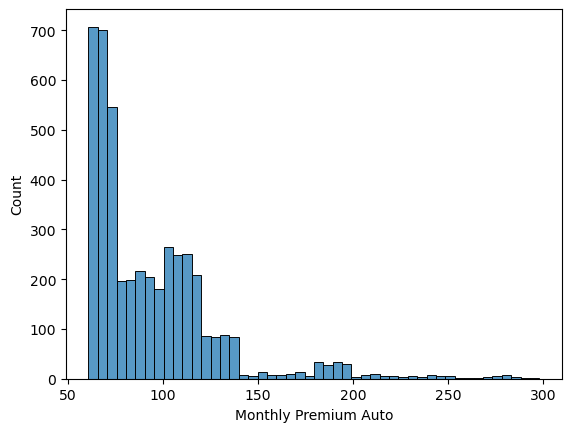

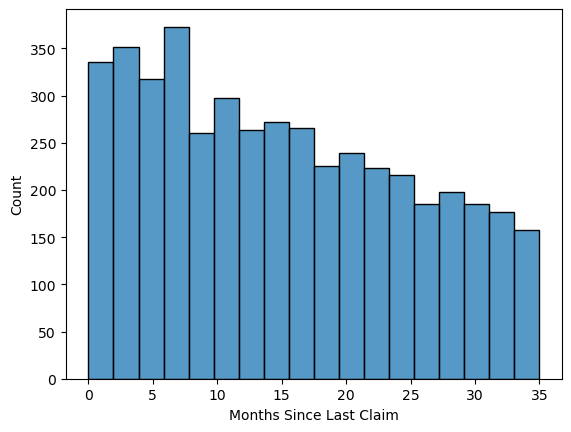

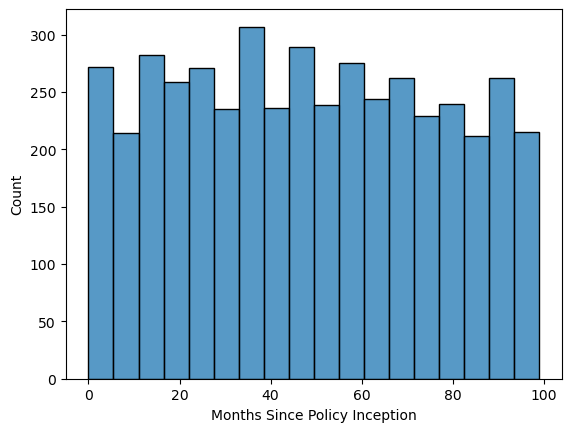

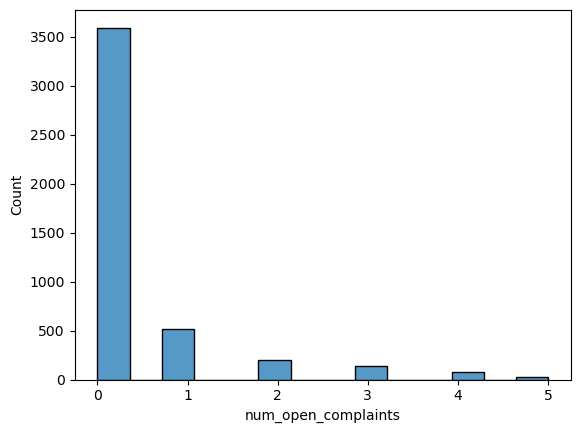

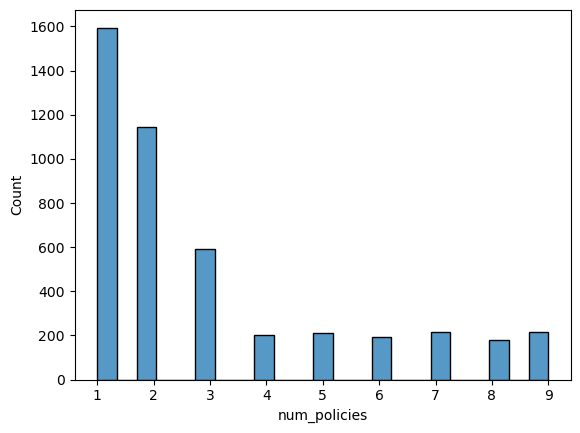

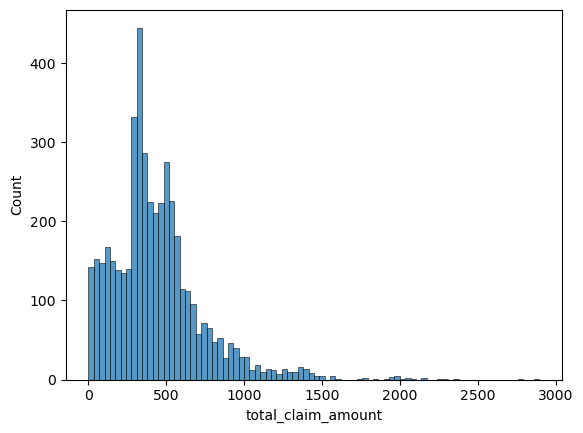

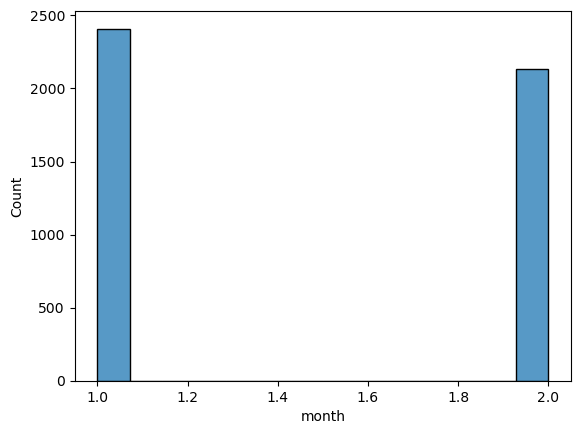

In [21]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
num_cols = numerical
for col in num_cols:
    sns.histplot(numerical[col], kde=False)
    plt.show()

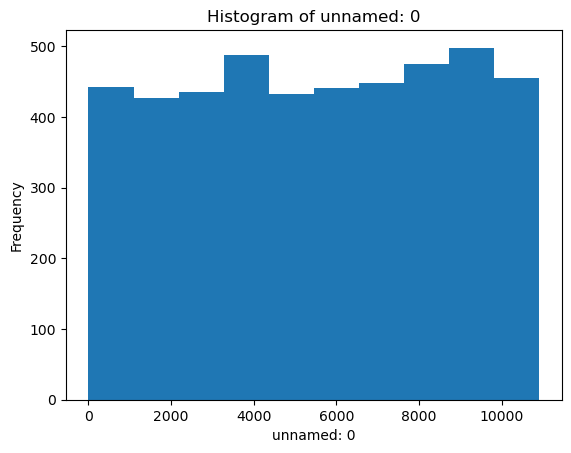

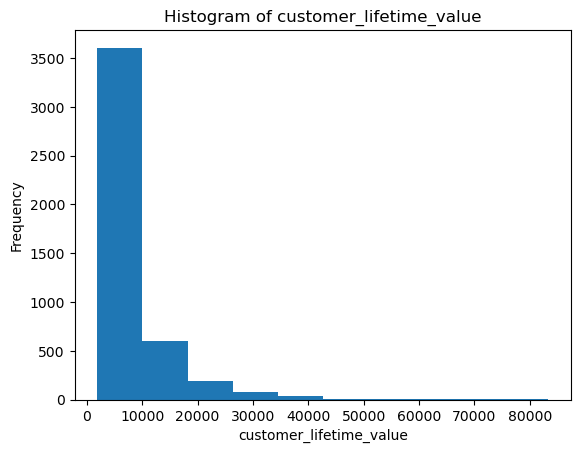

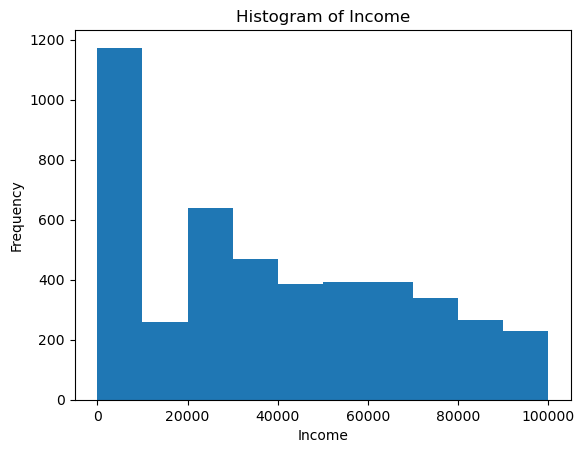

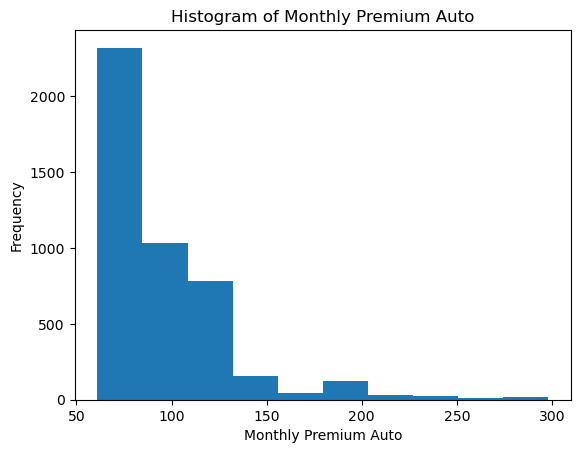

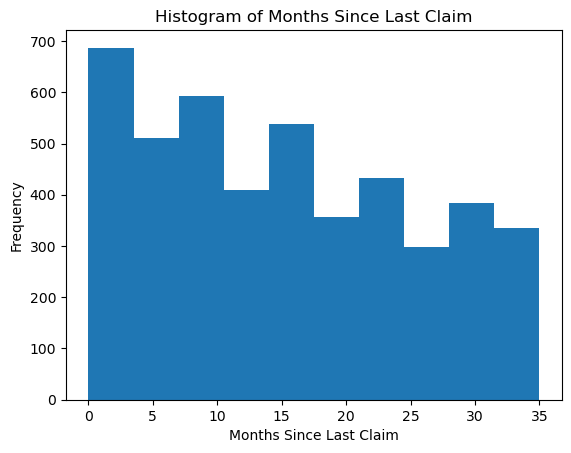

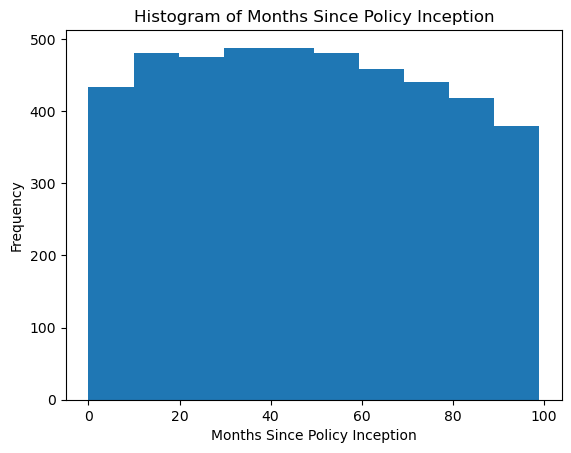

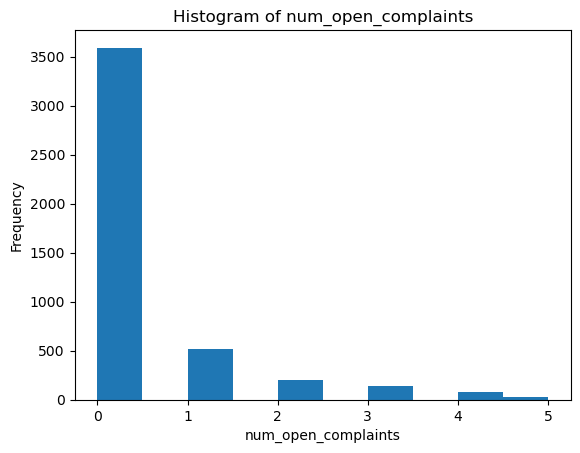

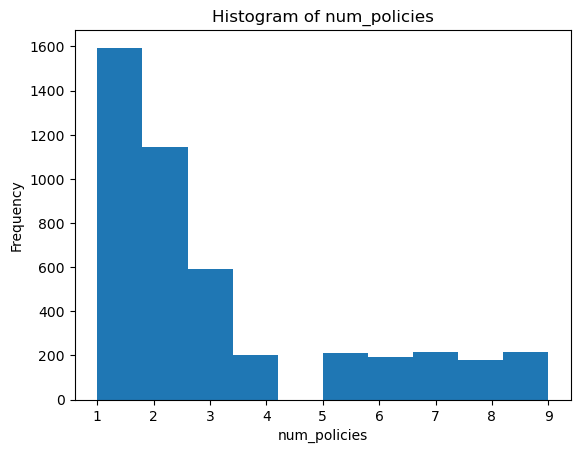

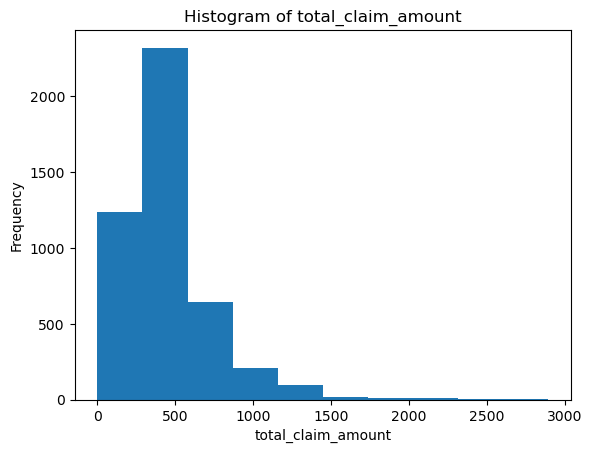

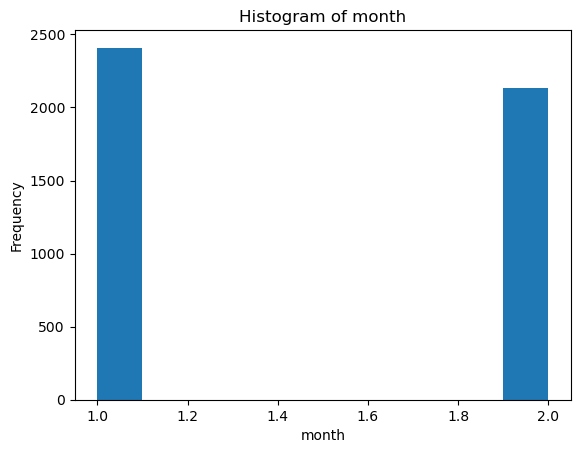

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
for col in num_cols:
    plt.hist(numerical[col])
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.title('Histogram of ' + col)
    plt.show()

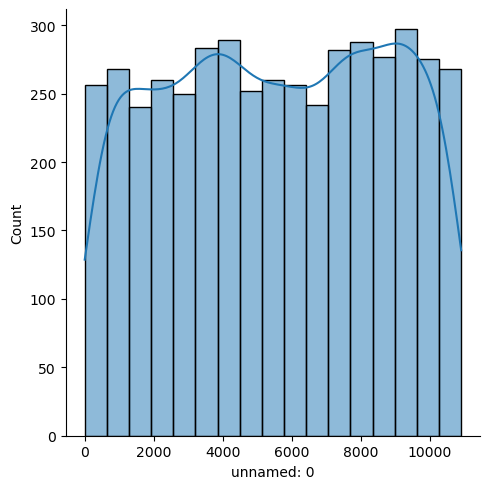

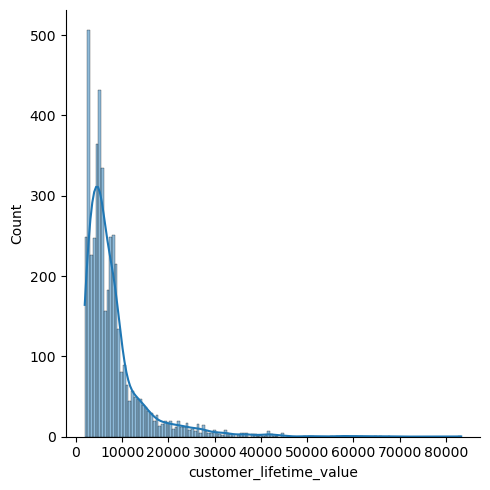

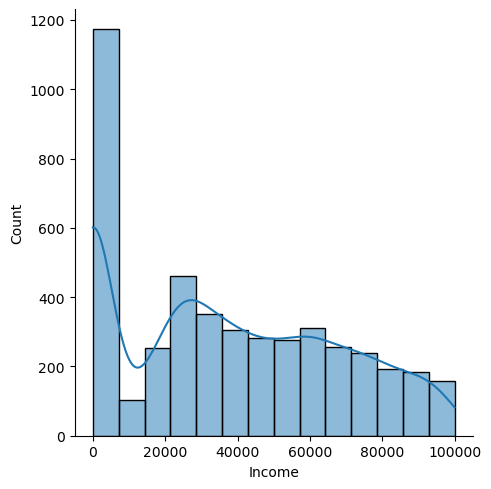

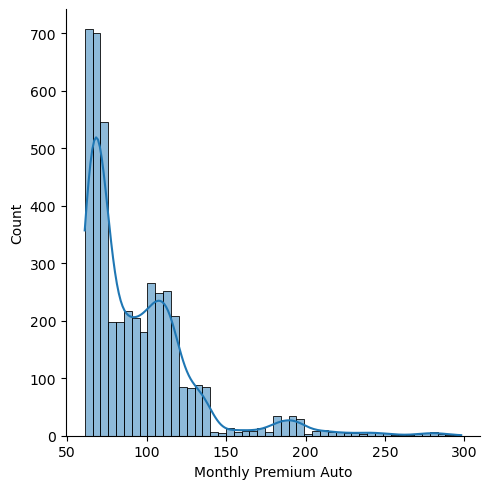

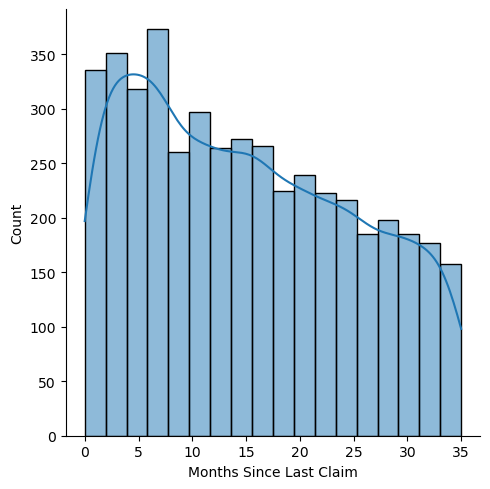

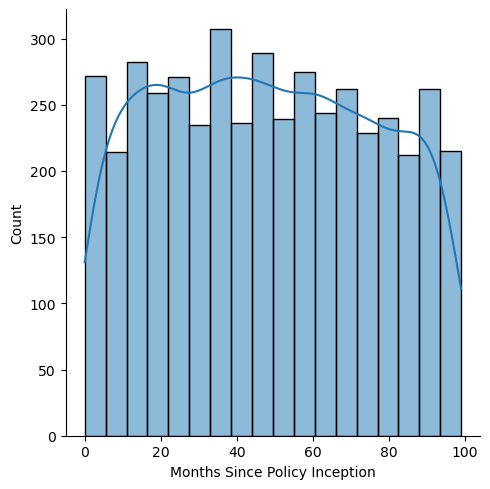

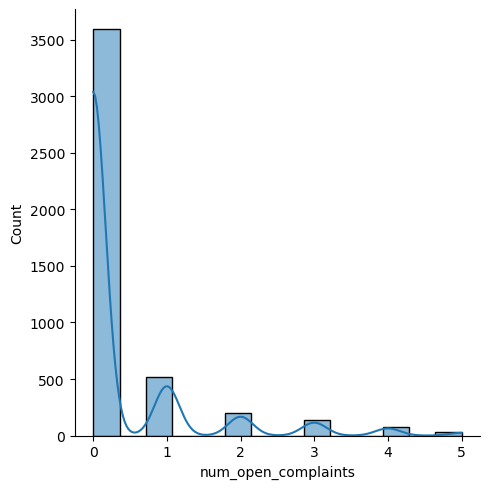

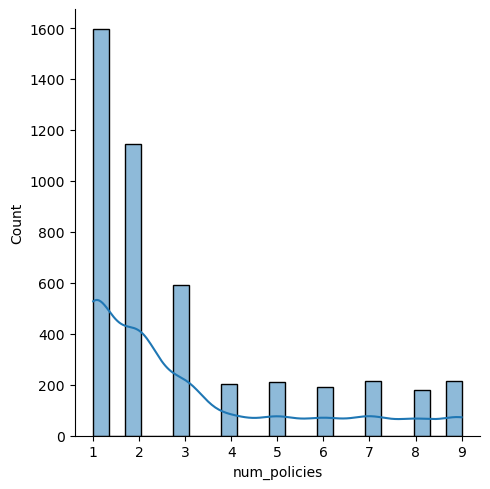

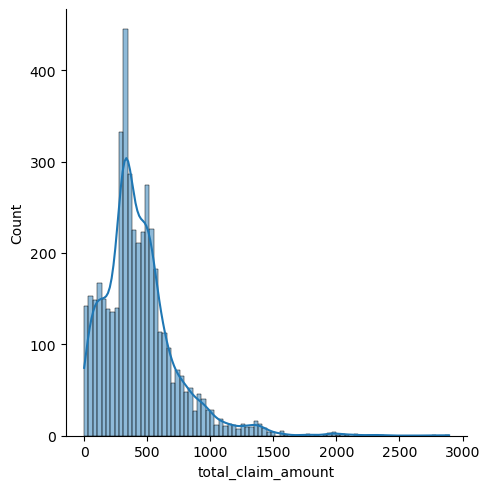

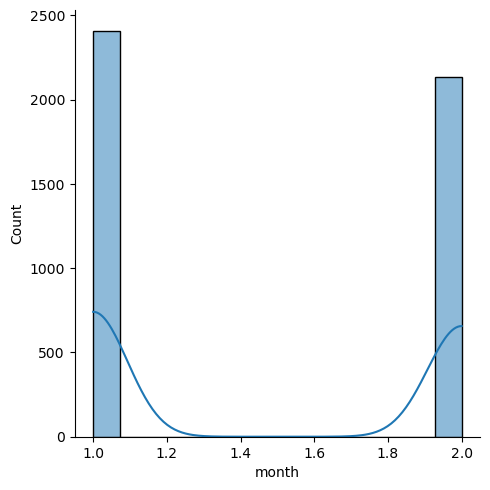

In [23]:
import pandas as pd
import seaborn as sns
for col in num_cols:
    sns.displot(numerical[col], kde=True)

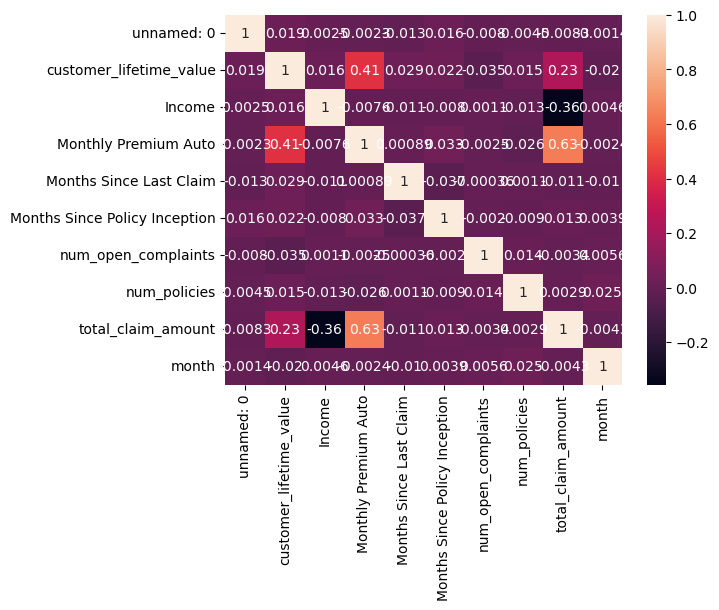

In [24]:
correlations_matrix = numerical.corr()
sns.heatmap(correlations_matrix, annot=True)
plt.show()

In [25]:
#ROUND 5


In [36]:
print(file1.dtypes)

Unnamed: 0                       float64
Customer                          object
State                             object
Customer Lifetime Value          float64
Response                          object
Coverage                          object
Education                         object
Effective To Date                 object
EmploymentStatus                  object
Gender                            object
Income                           float64
Location Code                     object
Marital Status                    object
Monthly Premium Auto             float64
Months Since Last Claim          float64
Months Since Policy Inception    float64
Number of Open Complaints        float64
Number of Policies               float64
Policy Type                       object
Policy                            object
Renew Offer Type                  object
Sales Channel                     object
Total Claim Amount               float64
Vehicle Class                     object
Vehicle Size    

In [29]:
import pandas as pd

# load data into a pandas DataFrame
file1 = pd.read_csv('marketing_customer_analysis.csv')

# select numerical and object columns separately
num_cols = file1.select_dtypes(include=['float64', 'int64']).columns
obj_cols = file1.select_dtypes(include=['object']).columns

# create X and y data frames
X = file1[num_cols].join(pd.get_dummies(file1[obj_cols]))
y = file1['Total Claim Amount']
display(y)
display(X)

0         292.800000
1         744.924331
2         480.000000
3         484.013411
4         707.925645
            ...     
10905    1214.400000
10906     273.018929
10907     381.306996
10908     618.288849
10909    1021.719397
Name: Total Claim Amount, Length: 10910, dtype: float64

,Unnamed: 0,Customer Lifetime Value,Income,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Total Claim Amount,Customer_AA10041,Customer_AA11235,Customer_AA16582,Customer_AA30683,Customer_AA34092,Customer_AA35519,Customer_AA56476,Customer_AA69265,Customer_AA71604,Customer_AA93585,Customer_AB13432,Customer_AB21519,Customer_AB23825,Customer_AB26022,Customer_AB31813,Customer_AB45325,Customer_AB60627,Customer_AB62982,Customer_AB69140,Customer_AB72731,Customer_AB73565,Customer_AB78984,Customer_AB96670,Customer_AB98823,Customer_AC13887,Customer_AC22873,Customer_AC24378,Customer_AC40767,Customer_AC42963,Customer_AC58002,Customer_AC67315,Customer_AC73173,Customer_AC75391,Customer_AC79024,Customer_AD12500,Customer_AD18174,Customer_AD28349,Customer_AD28535,Customer_AD33653,Customer_AD33971,Customer_AD38685,Customer_AD56037,Customer_AD63766,Customer_AD71478,Customer_AD89594,Customer_AD95939,Customer_AE23906,Customer_AE30506,Customer_AE60813,Customer_AE62631,Customer_AE74442,Customer_AE89300,Customer_AE90216,Customer_AE93522,Customer_AE98193,Customer_AF10970,Customer_AF17671,Customer_AF20716,Customer_AF36894,Customer_AF37776,Customer_AF41118,Customer_AF47139,Customer_AF48816,Customer_AF49027,Customer_AF49625,Customer_AF69537,Customer_AF81450,Customer_AG22225,Customer_AG32304,Customer_AG39150,Customer_AG45299,Customer_AG47947,Customer_AG56998,Customer_AG58599,Customer_AG62087,Customer_AG62140,Customer_AG85127,Customer_AG85615,Customer_AH17051,Customer_AH22694,Customer_AH39293,Customer_AH41065,Customer_AH41449,Customer_AH53588,Customer_AH55475,Customer_AH58807,Customer_AH65907,Customer_AH84063,Customer_AH89786,Customer_AH92481,Customer_AH97088,Customer_AH99727,Customer_AI11191,Customer_AI14767,Customer_AI16519,Customer_AI47152,Customer_AI49188,Customer_AI49712,Customer_AI58313,Customer_AI58500,Customer_AI61368,Customer_AI74959,Customer_AI85843,Customer_AJ32539,Customer_AJ58038,Customer_AJ69060,Customer_AJ69778,Customer_AJ89107,Customer_AJ89108,Customer_AK11669,Customer_AK11719,Customer_AK17025,Customer_AK44985,Customer_AK46006,Customer_AK54675,Customer_AK59340,Customer_AK61491,Customer_AK72422,Customer_AK90865,Customer_AL21967,Customer_AL27471,Customer_AL35726,Customer_AL43475,Customer_AL43715,Customer_AL46984,Customer_AL50693,Customer_AL78075,Customer_AL95338,Customer_AL96740,Customer_AM17304,Customer_AM26598,Customer_AM26717,Customer_AM28777,Customer_AM29546,Customer_AM30008,Customer_AM32820,Customer_AM34581,Customer_AM36670,Customer_AM52614,Customer_AM53473,Customer_AM57175,Customer_AM72411,Customer_AM79057,Customer_AM88377,Customer_AM89558,Customer_AM92343,Customer_AM94127,Customer_AM97901,Customer_AM99192,Customer_AN21193,Customer_AN32867,Customer_AN36757,Customer_AN47199,Customer_AN53225,Customer_AN57220,Customer_AN67558,Customer_AN79079,Customer_AN80983,Customer_AN97123,Customer_AO20938,Customer_AO40386,Customer_AO42003,Customer_AO46433,Customer_AO74776,Customer_AO77635,Customer_AO87348,Customer_AO98601,Customer_AP23850,Customer_AP27994,Customer_AP32891,Customer_AP34711,Customer_AP46166,Customer_AP47670,Customer_AP52126,Customer_AP52565,Customer_AP56340,Customer_AP59947,Customer_AP63665,Customer_AP65984,Customer_AP66226,Customer_AP67935,Customer_AP89323,Customer_AP90638,Customer_AP95078,Customer_AP98768,Customer_AQ11656,Customer_AQ25590,Customer_AQ30231,Customer_AQ34238,Customer_AQ46199,Customer_AQ51159,Customer_AQ51368,Customer_AQ52711,Customer_AQ70385,Customer_AQ70619,Customer_AQ91207,Customer_AQ94108,Customer_AR17553,Customer_AR25213,Customer_AR40217,Customer_AR47849,Customer_AR59416,Customer_AR61426,Customer_AR63478,Customer_AR69517,Customer_AR75105,Customer_AR83514,Customer_AR96516,Customer_AR99766,Customer_AS17174,Customer_AS18084,Customer_AS26192,Customer_AS48176,Customer_AS55478,Customer_AS55677,Customer_AS60178,Customer_AS62048,Customer_AS77287,Customer_AS78838,Customer_AS93181,Customer_AS97690,Customer_AS99827,Customer_AT13963,Customer_AT18041,Customer_A

In [32]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# select only the numerical columns
numerical_cols = file1.select_dtypes(include=['float', 'int']).columns

# create an instance of the MinMaxScaler
scaler = MinMaxScaler()

# normalize the numerical columns
file1[numerical_cols] = scaler.fit_transform(file1[numerical_cols])

# display the normalized data
print(file1)



       Unnamed: 0 Customer       State  Customer Lifetime Value Response  \
0        0.000000  DK49336     Arizona                 0.035752       No   
1        0.000092  KX64629  California                 0.004059       No   
2        0.000183  LZ68649  Washington                 0.160264       No   
3        0.000275  XL78013      Oregon                 0.250953      Yes   
4        0.000367  QA50777      Oregon                 0.087527       No   
...           ...      ...         ...                      ...      ...   
10905    0.999633  FE99816      Nevada                 0.167823       No   
10906    0.999725  KX53892      Oregon                 0.041281       No   
10907    0.999817  TL39050     Arizona                 0.270122       No   
10908    0.999908  WA60547  California                 0.123717       No   
10909    1.000000  IV32877         NaN                 0.060907      NaN   

       Coverage Education Effective To Date EmploymentStatus Gender    Income  \
0     

# Round 6

In [33]:
# select only the object columns
object_cols = file1.select_dtypes(include=['object']).columns

# perform one-hot encoding on the object columns
file1_encoded = pd.get_dummies(file1, columns=object_cols)

# display the encoded data
print(file1_encoded)


       Unnamed: 0  Customer Lifetime Value    Income  Monthly Premium Auto  \
0        0.000000                 0.035752  0.480381              0.000000   
1        0.000092                 0.004059  0.000000              0.012658   
2        0.000183                 0.160264  0.221432              0.164557   
3        0.000275                 0.250953  0.490873              0.151899   
4        0.000367                 0.087527  0.236795              0.236287   
...           ...                      ...       ...                   ...   
10905    0.999633                 0.167823  0.000000              0.810127   
10906    0.999725                 0.041281  0.611576              0.016878   
10907    0.999817                 0.270122  0.398446              0.590717   
10908    0.999908                 0.123717  0.642072              0.409283   
10909    1.000000                 0.060907  0.000000              0.168776   

       Months Since Last Claim  Months Since Policy Inception  

In [34]:
import pandas as pd
# concatenate the dataframes along columns
df_combined = pd.concat([file1, file1_encoded], axis=1)

# display the concatenated dataframe
print(df_combined)


       Unnamed: 0 Customer       State  Customer Lifetime Value Response  \
0        0.000000  DK49336     Arizona                 0.035752       No   
1        0.000092  KX64629  California                 0.004059       No   
2        0.000183  LZ68649  Washington                 0.160264       No   
3        0.000275  XL78013      Oregon                 0.250953      Yes   
4        0.000367  QA50777      Oregon                 0.087527       No   
...           ...      ...         ...                      ...      ...   
10905    0.999633  FE99816      Nevada                 0.167823       No   
10906    0.999725  KX53892      Oregon                 0.041281       No   
10907    0.999817  TL39050     Arizona                 0.270122       No   
10908    0.999908  WA60547  California                 0.123717       No   
10909    1.000000  IV32877         NaN                 0.060907      NaN   

       Coverage Education Effective To Date EmploymentStatus Gender    Income  \
0     

In [42]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

file1 = pd.read_csv('marketing_customer_analysis.csv')
# split data into features (X) and target (y)
X = file1.drop('Total Claim Amount', axis=1)
y = file1['Total Claim Amount']

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# create a linear regression model and fit it to the training data
model = LinearRegression()
model.fit(X_train, y_train)

# make predictions on the testing data and evaluate the model
y_pred = model.predict(X_test)
score = model.score(X_test, y_test)

# display the model score
print('Model score:', score)


ValueError: could not convert string to float: 'XK11432'

In [43]:
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# load data into a pandas dataframe
file1 = pd.read_csv('marketing_customer_analysis.csv')

# split data into features (X) and target (y)
X = file1.drop('Total Claim Amount', axis=1)
y = file1['Total Claim Amount']

# train a model on the training data
model = MyModel()
model.fit(X_train, y_train)

# make predictions on the testing data
y_pred = model.predict(X_test)

# calculate metrics
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
mae = mean_absolute_error(y_test, y_pred)

# display the metrics
print('R^2:', r2)
print('MSE:', mse)
print('RMSE:', rmse)
print('MAE:', mae)


NameError: name 'MyModel' is not defined

# Round 7

In [44]:
from scipy import stats

# calculate the Z-score of each data point
z_scores = stats.zscore(file1)

# identify outliers
threshold = 3
outliers = np.where(np.abs(z_scores) > threshold)

# remove outliers from the dataframe
file = file1[(np.abs(z_scores) < threshold).all(axis=1)]


C:\Users\rodri\anaconda3\lib\site-packages\scipy\stats\_stats_py.py:112: RuntimeWarning: The input array could not be properly checked for nan values. nan values will be ignored.
  warnings.warn("The input array could not be properly "


TypeError: can only concatenate str (not "float") to str